In [ ]:
<a href="https://colab.research.google.com/github/Aravindh4404/FYPSeagullClassification01/blob/main/Copy_of_VGGnet_HQ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import sys  # Added to fix the NameError
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split, WeightedRandomSampler, Dataset
import numpy as np
import random
import matplotlib.pyplot as plt
from datetime import datetime
from collections import Counter
from sklearn.metrics import (classification_report, confusion_matrix, roc_auc_score, roc_curve,
                             balanced_accuracy_score, matthews_corrcoef, precision_recall_curve,
                             average_precision_score)
import seaborn as sns
import csv

# For Google Colab: Mount Google Drive
try:
    from google.colab import drive
    DRIVE_MOUNTED = False
except ImportError:
    DRIVE_MOUNTED = False  # Not in Google Colab

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Define the device for computation
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Mount Google Drive to save and load the model (if using Google Colab)
if DRIVE_MOUNTED is False and 'google.colab' in sys.modules:
    drive.mount('/content/drive')
    DRIVE_MOUNTED = True
else:
    print("Google Drive not mounted or not running in Google Colab.")

# Define the folder to save model checkpoints
date_str = datetime.now().strftime('%Y%m%d')
checkpoint_folder = f'/content/drive/My Drive/FYP/VGGModel/HQ2ltst_{date_str}/' if DRIVE_MOUNTED else './checkpoints/'
os.makedirs(checkpoint_folder, exist_ok=True)

# Data Augmentation for Training Set
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),  # VGG expects 224x224 input size
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),  # ImageNet normalization
])

# Additional augmentations for minority class
transform_minority = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])


# Load datasets
data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/train' if DRIVE_MOUNTED else './data/train'
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test' if DRIVE_MOUNTED else './data/test'

train_dataset_full = datasets.ImageFolder(data_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_data_path)

# Split the dataset into 80% training and 20% validation
train_size = int(0.8 * len(train_dataset_full))
val_size = len(train_dataset_full) - train_size
train_dataset, val_dataset = random_split(train_dataset_full, [train_size, val_size])

# Identify class counts
train_labels = [label for _, label in train_dataset]
label_counts = Counter(train_labels)
print(f"Class Counts: {label_counts}")

# Calculate class weights
total_samples = len(train_dataset)
num_classes = len(label_counts)
class_weights = [total_samples / (num_classes * label_counts[i]) for i in range(num_classes)]
print(f"Class Weights: {class_weights}")

# Convert class weights to tensor and move to device
class_weights_tensor = torch.tensor(class_weights).to(device)

# Assign weight to each sample for sampler
samples_weights = [class_weights[label] for label in train_labels]

# Create WeightedRandomSampler
sampler = WeightedRandomSampler(weights=samples_weights, num_samples=len(samples_weights), replacement=True)

from torchvision.transforms import functional as F

class CustomImageDataset(Dataset):
    def __init__(self, dataset, transform_major, transform_minority, minority_class):
        self.dataset = dataset
        self.transform_major = transform_major
        self.transform_minority = transform_minority
        self.minority_class = minority_class

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, label = self.dataset[idx]
        if label == self.minority_class:
            # Convert the tensor to a PIL image before applying the transformation
            image = F.to_pil_image(image)
            image = self.transform_minority(image)
        else:
            image = F.to_pil_image(image)  # Convert tensor to PIL image
            image = self.transform_major(image)
        return image, label

# Determine minority and majority classes based on class counts
# Assuming class with fewer samples is minority
minority_class = min(label_counts, key=label_counts.get)
majority_class = max(label_counts, key=label_counts.get)
print(f"Minority Class: {minority_class}, Majority Class: {majority_class}")

# Create custom training dataset
custom_train_dataset = CustomImageDataset(
    train_dataset,
    transform_major=transform_train,
    transform_minority=transform_minority,
    minority_class=minority_class
)

# Update train_labels and sampler for the custom dataset
custom_train_labels = [label for _, label in custom_train_dataset]
samples_weights = [class_weights[label] for label in custom_train_labels]

# Create WeightedRandomSampler for the custom dataset
sampler = WeightedRandomSampler(weights=samples_weights, num_samples=len(samples_weights), replacement=True)

# Create data loaders
batch_size = 32
train_loader = DataLoader(custom_train_dataset, batch_size=batch_size, sampler=sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Use Pre-trained VGG-16 model and modify it for binary classification
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        # Load pre-trained VGG-16 model
        self.vgg = models.vgg16(pretrained=True)
        # Freeze early layers if desired
        # for param in self.vgg.features.parameters():
        #     param.requires_grad = False
        # Replace the classifier with a custom binary classification layer
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, num_classes)  # num_classes = 2 for binary classification
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize the VGG model
num_classes = 2  # Binary classification
model = VGG16Modified().to(device)

# Define loss function and optimizer with class weights
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3)

def validate(model, loader, criterion):
    model.eval()
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, predicted = torch.max(outputs.data, 1)
            probs = torch.softmax(outputs, dim=1)[:, 1]  # Probability of class 1

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    accuracy = 100 * correct / total
    balanced_acc = balanced_accuracy_score(all_labels, all_preds)
    mcc = matthews_corrcoef(all_labels, all_preds)
    roc_auc = roc_auc_score(all_labels, all_probs)
    ap_score = average_precision_score(all_labels, all_probs)

    cls_report = classification_report(all_labels, all_preds, target_names=['Class 0', 'Class 1'])
    conf_matrix = confusion_matrix(all_labels, all_preds)

    precision, recall, _ = precision_recall_curve(all_labels, all_probs)

    print(f'Validation Accuracy: {accuracy:.2f}%')
    print(f'Balanced Accuracy: {balanced_acc:.2f}%')
    print(f'Matthews Correlation Coefficient: {mcc:.2f}')
    print(f'ROC-AUC: {roc_auc:.2f}')
    print(f'Average Precision (AP): {ap_score:.2f}')
    print("Classification Report:")
    print(cls_report)
    print("Confusion Matrix:")
    print(conf_matrix)

    # Plot Confusion Matrix
    plt.figure(figsize=(6,5))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Class 0', 'Class 1'],
                yticklabels=['Class 0', 'Class 1'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    # Plot ROC Curve
    fpr, tpr, _ = roc_curve(all_labels, all_probs)
    plt.figure(figsize=(6,5))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()

    # Plot Precision-Recall Curve
    plt.figure(figsize=(6,5))
    plt.plot(recall, precision, label=f'AP = {ap_score:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall (PR) Curve')
    plt.legend(loc='lower left')
    plt.grid(True)
    plt.show()

    return accuracy, balanced_acc, mcc, roc_auc, ap_score

def train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20):
    best_acc = 0.0
    best_balanced_acc = 0.0
    best_mcc = 0.0
    best_roc_auc = 0.0
    best_ap_score = 0.0
    train_losses = []
    val_accuracies = []
    val_balanced_accuracies = []
    val_mccs = []
    val_roc_aucs = []
    val_ap_scores = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)  # Gradient clipping
            optimizer.step()

            running_loss += loss.item()

        # Calculate average training loss
        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.6f}")

        # Validate the model and get all metrics
        val_acc, val_balanced_acc, val_mcc, val_roc_auc, val_ap_score = validate(model, val_loader, criterion)
        val_accuracies.append(val_acc)
        val_balanced_accuracies.append(val_balanced_acc)
        val_mccs.append(val_mcc)
        val_roc_aucs.append(val_roc_auc)
        val_ap_scores.append(val_ap_score)
        scheduler.step(val_acc)

        # Save the best model based on ROC-AUC
        if val_roc_auc > best_roc_auc:
            best_roc_auc = val_roc_auc
            best_balanced_acc = val_balanced_acc
            best_mcc = val_mcc
            best_acc = val_acc
            best_ap_score = val_ap_score
            best_model_path = os.path.join(checkpoint_folder, f"best_model_vgg_{date_str}.pth")
            torch.save(model.state_dict(), best_model_path)
            print(f"New best model saved with ROC-AUC: {best_roc_auc:.2f}, "
                  f"Balanced Accuracy: {best_balanced_acc:.2f}%, "
                  f"Accuracy: {best_acc:.2f}%, MCC: {best_mcc:.2f}, AP: {best_ap_score:.2f} at {best_model_path}")

    # Plot training loss and validation metrics
    plt.figure(figsize=(25, 5))

    # Training Loss
    plt.subplot(1, 5, 1)
    plt.plot(train_losses, label='Training Loss', color='blue')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.grid(True)
    plt.legend()

    # Validation Accuracy
    plt.subplot(1, 5, 2)
    plt.plot(val_accuracies, label='Validation Accuracy', color='green')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.title('Validation Accuracy')
    plt.grid(True)
    plt.legend()

    # Validation Balanced Accuracy
    plt.subplot(1, 5, 3)
    plt.plot(val_balanced_accuracies, label='Validation Balanced Accuracy', color='orange')
    plt.xlabel('Epochs')
    plt.ylabel('Balanced Accuracy (%)')
    plt.title('Validation Balanced Accuracy')
    plt.grid(True)
    plt.legend()

    # Validation MCC
    plt.subplot(1, 5, 4)
    plt.plot(val_mccs, label='Validation MCC', color='purple')
    plt.xlabel('Epochs')
    plt.ylabel('MCC')
    plt.title('Validation MCC')
    plt.grid(True)
    plt.legend()

    # Validation ROC-AUC and AP
    plt.subplot(1, 5, 5)
    plt.plot(val_roc_aucs, label='Validation ROC-AUC', color='red')
    plt.plot(val_ap_scores, label='Validation AP', color='cyan')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.title('Validation ROC-AUC & AP')
    plt.grid(True)
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Save the final model
        # Save the current model as the final model (replacing the previous final model)
    final_model_path = os.path.join(checkpoint_folder, f"final_model_vgg_{date_str}.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"Final model saved at {final_model_path} (replacing the previous one)")

    # Optionally, save metrics to a CSV file
    save_metrics(train_losses, val_accuracies, val_balanced_accuracies, val_mccs, val_roc_aucs, val_ap_scores)

def save_metrics(train_losses, val_accuracies, val_balanced_accuracies, val_mccs, val_roc_aucs, val_ap_scores):
    metrics_path = os.path.join(checkpoint_folder, 'metrics.csv')
    with open(metrics_path, 'w', newline='') as csvfile:
        fieldnames = ['Epoch', 'Training Loss', 'Validation Accuracy',
                      'Validation Balanced Accuracy', 'Validation MCC',
                      'Validation ROC-AUC', 'Validation AP']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

        writer.writeheader()
        for epoch in range(len(train_losses)):
            writer.writerow({
                'Epoch': epoch + 1,
                'Training Loss': train_losses[epoch],
                'Validation Accuracy': val_accuracies[epoch],
                'Validation Balanced Accuracy': val_balanced_accuracies[epoch],
                'Validation MCC': val_mccs[epoch],
                'Validation ROC-AUC': val_roc_aucs[epoch],
                'Validation AP': val_ap_scores[epoch]
            })
    print(f"Metrics saved to {metrics_path}")

def test(model, loader, criterion):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            probs = torch.softmax(outputs, dim=1)[:, 1]  # Probability of class 1

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    accuracy = 100 * correct / total
    balanced_acc = balanced_accuracy_score(all_labels, all_preds)
    mcc = matthews_corrcoef(all_labels, all_preds)
    roc_auc = roc_auc_score(all_labels, all_probs)
    ap_score = average_precision_score(all_labels, all_probs)

    cls_report = classification_report(all_labels, all_preds, target_names=['Class 0', 'Class 1'])
    conf_matrix = confusion_matrix(all_labels, all_preds)

    precision, recall, _ = precision_recall_curve(all_labels, all_probs)

    print(f'Test Loss: {test_loss/len(loader):.6f}, Test Accuracy: {accuracy:.2f}%')
    print(f'Balanced Accuracy: {balanced_acc:.2f}%')
    print(f'Matthews Correlation Coefficient: {mcc:.2f}')
    print(f'Test ROC-AUC: {roc_auc:.2f}')
    print(f'Average Precision (AP): {ap_score:.2f}')
    print("Test Classification Report:")
    print(cls_report)
    print("Test Confusion Matrix:")
    print(conf_matrix)

    # Plot Confusion Matrix
    plt.figure(figsize=(6,5))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens',
                xticklabels=['Class 0', 'Class 1'],
                yticklabels=['Class 0', 'Class 1'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Test Confusion Matrix')
    plt.show()

    # Plot ROC Curve
    fpr, tpr, _ = roc_curve(all_labels, all_probs)
    plt.figure(figsize=(6,5))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f})', color='purple')
    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()

    # Plot Precision-Recall Curve
    plt.figure(figsize=(6,5))
    plt.plot(recall, precision, label=f'AP = {ap_score:.2f}', color='cyan')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall (PR) Curve')
    plt.legend(loc='lower left')
    plt.grid(True)
    plt.show()

    return accuracy, balanced_acc, mcc, roc_auc, ap_score

if __name__ == "__main__":
    epochs = 20  # You can adjust the number of epochs as needed
    train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=epochs)

    # Optionally, load the best model and perform testing
    best_model_path = os.path.join(checkpoint_folder, f"best_model_vgg_{date_str}.pth")
    if os.path.exists(best_model_path):
        model.load_state_dict(torch.load(best_model_path))
        print(f"Loaded best model from {best_model_path}")
    else:
        print(f"Best model not found at {best_model_path}, using the final model.")

    test(model, test_loader, criterion)


ModuleNotFoundError: No module named 'torch'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:08<00:00, 68.8MB/s]
<ipython-input-2-43b6ae4ee07a>:36: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. 

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/imageRTEs.jpg


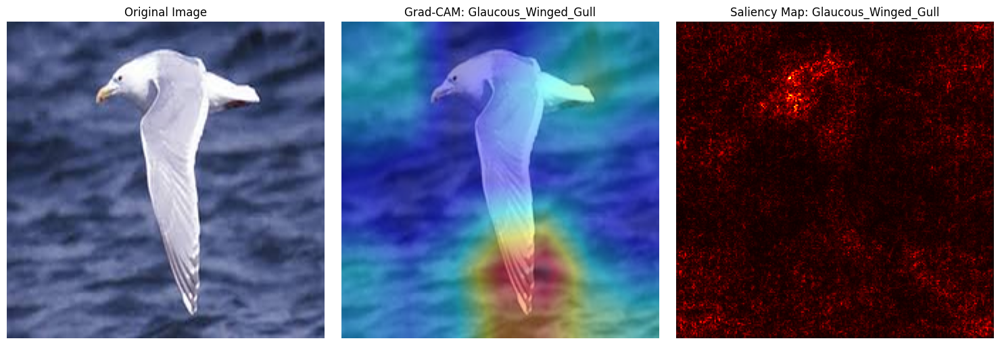

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/iDFGmages.jpg


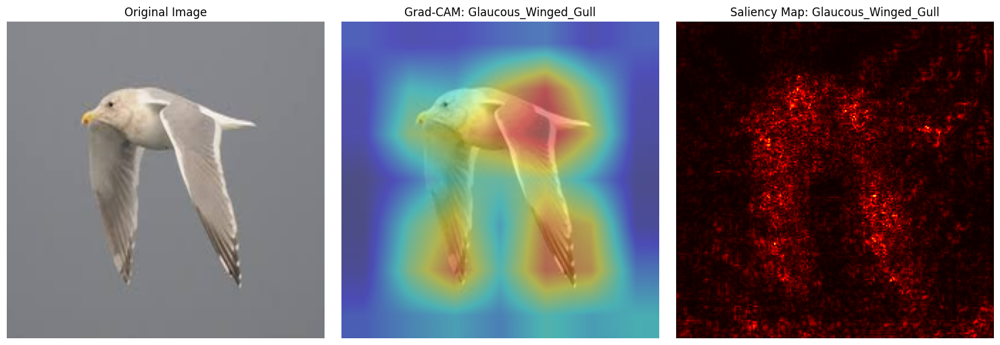

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/images.jpg


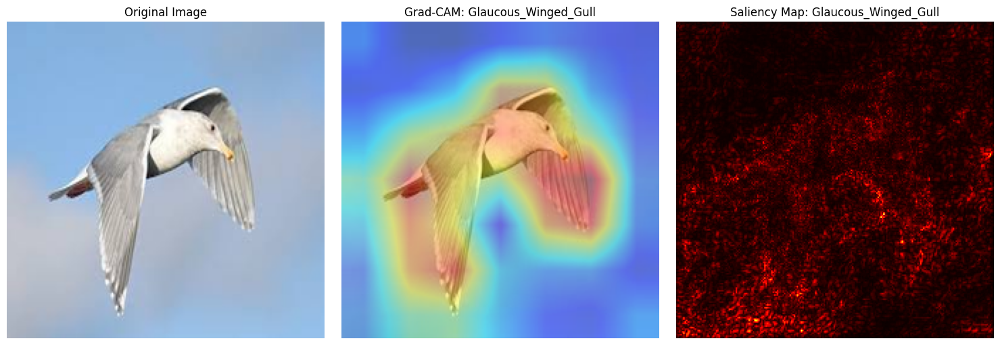

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/480 (11).jpeg


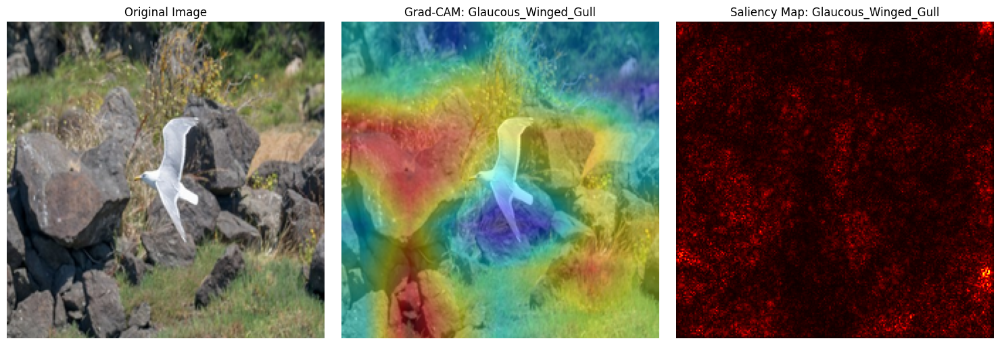

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/320 (5).jpeg


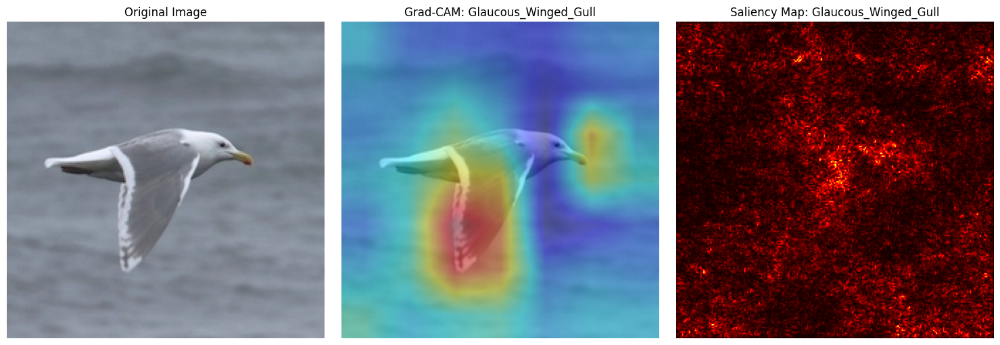

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (14).jpeg


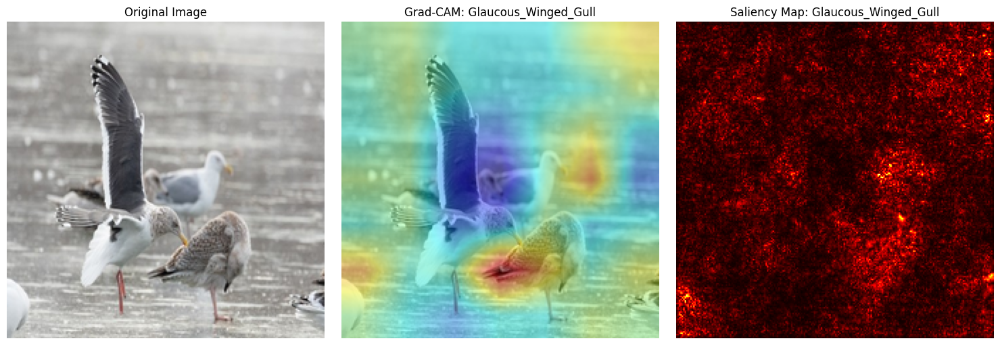

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (34).jpeg


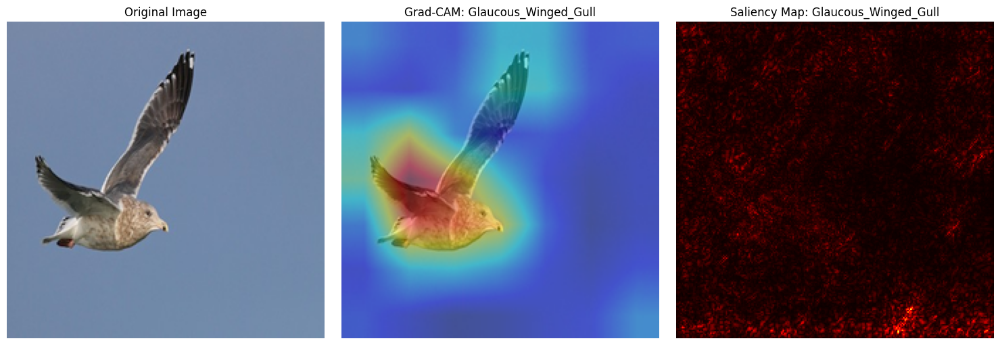

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (42).jpeg


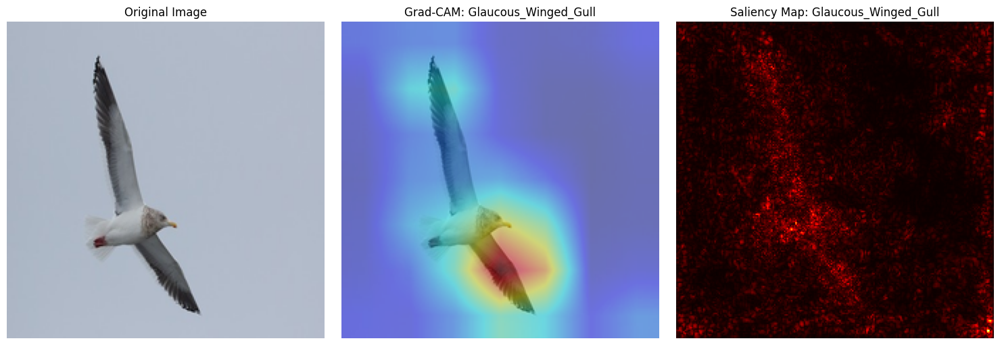

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (52).jpeg


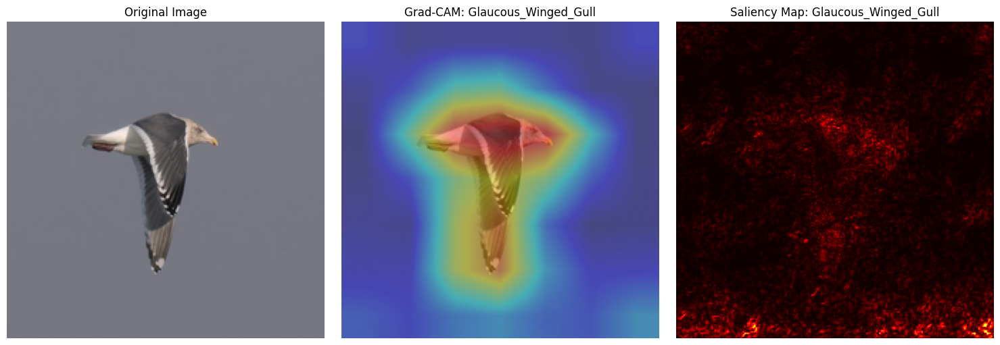

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (10).jpeg


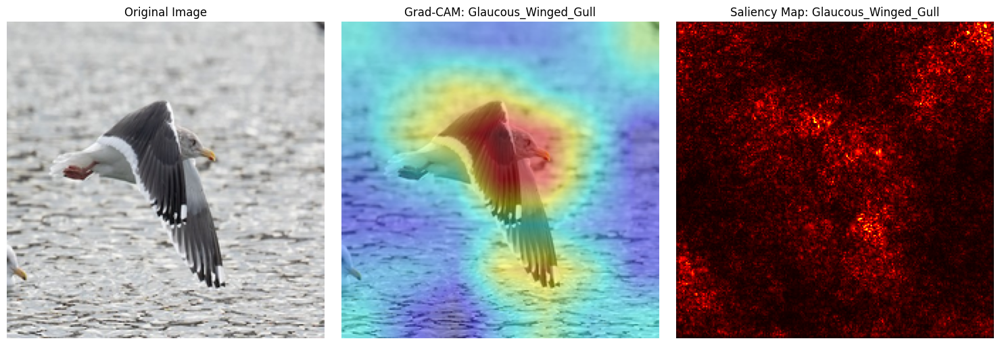

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (28).jpeg


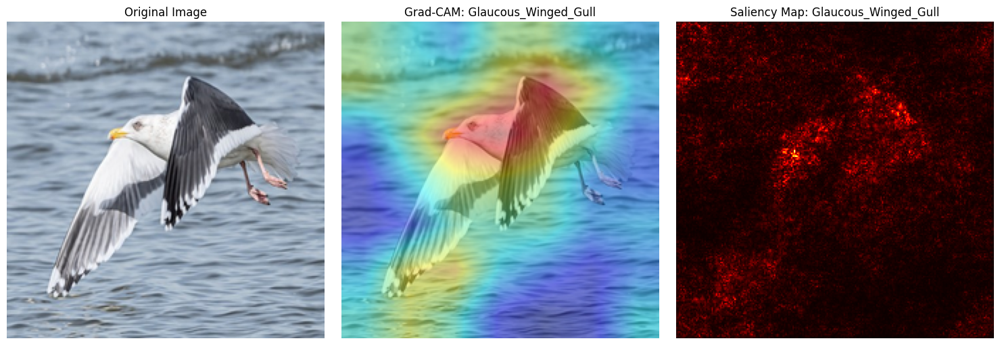

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (49).jpeg


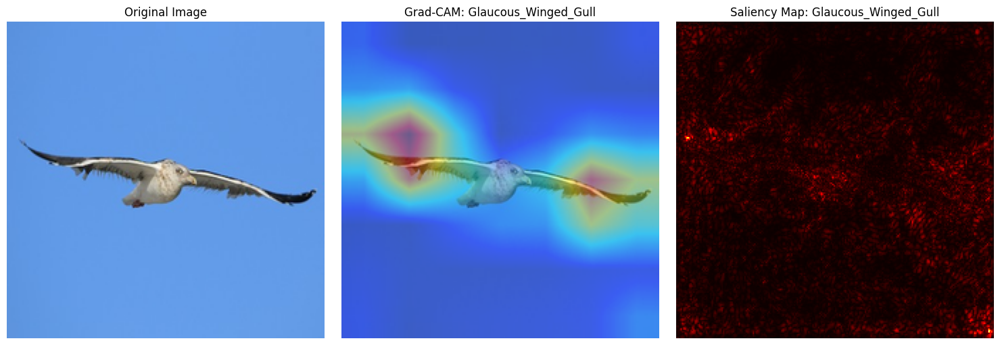

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/007.jpg


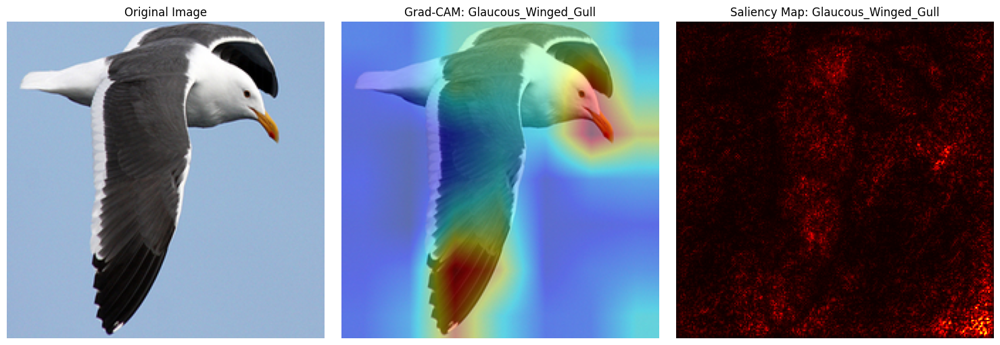

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (3).jpeg


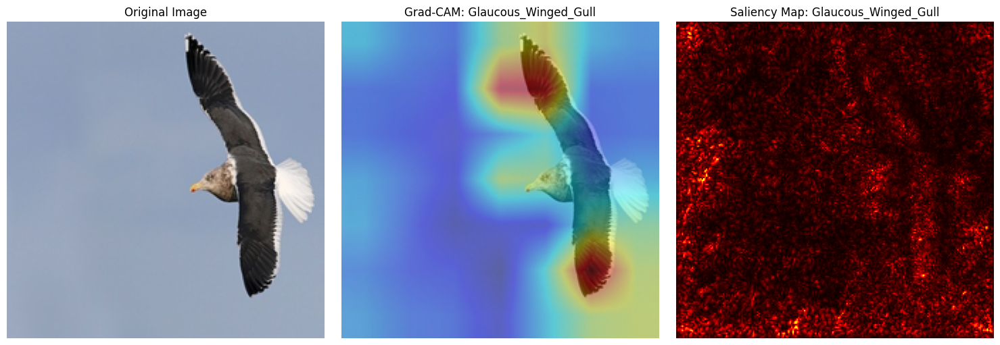

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (32).jpeg


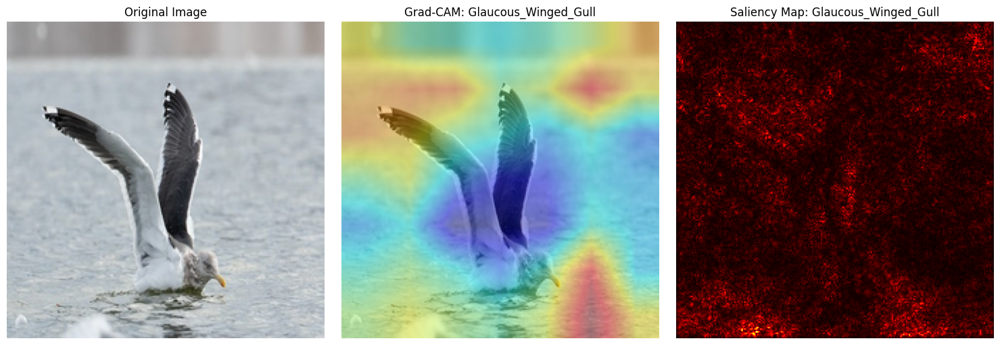

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (9).jpeg


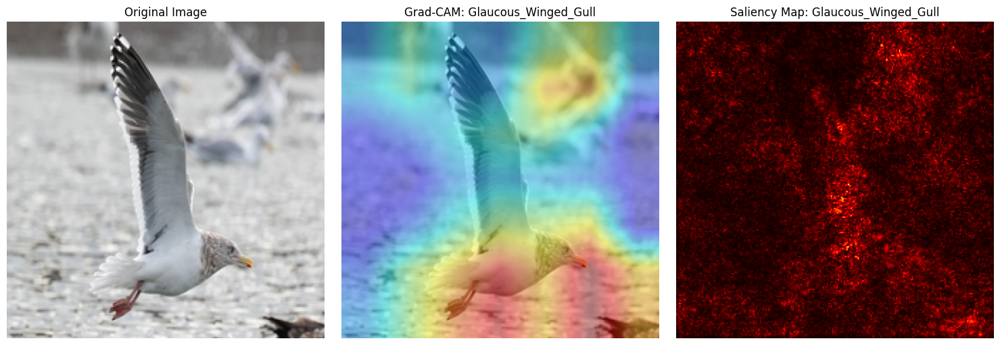

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (53).jpeg


In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241209/best_model_vgg_20241209.pth'
test_folder_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'  # Replace with your test folder path

# Load the trained VGG model
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        from torchvision.models import VGG16_Weights
        self.vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        # Replace the classifier with a custom binary classification layer
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize and load the model
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']  # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize to match VGG input size
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # ImageNet normalization
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Grad-CAM implementation
def generate_gradcam(model, image_tensor, target_layer):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture feature maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the target layer
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and feature maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1, 2))  # Global average pooling of gradients
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1
    return cam, predicted_class_idx

# Saliency Map implementation
def generate_saliency_map(model, image_tensor):
    image_tensor.requires_grad_()
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to calculate gradients
    model.zero_grad()
    output[0, predicted_class_idx].backward()

    # Calculate saliency
    saliency = image_tensor.grad.data.abs()
    saliency, _ = torch.max(saliency, dim=1)  # Take max across channels
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize for visualization
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency, predicted_class_idx

# Function to visualize results
def visualize_results(image_path, gradcam, saliency, predicted_class):
    original_image = Image.open(image_path).resize((224, 224), Image.LANCZOS)
    original_image = np.array(original_image)

    # Grad-CAM heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    gradcam_image = np.clip(0.4 * heatmap + 0.6 * original_image, 0, 255).astype(np.uint8)

    # Plot images
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Grad-CAM
    plt.subplot(1, 3, 2)
    plt.title(f"Grad-CAM: {class_names[predicted_class]}")
    plt.imshow(gradcam_image)
    plt.axis('off')

    # Saliency Map
    plt.subplot(1, 3, 3)
    plt.title(f"Saliency Map: {class_names[predicted_class]}")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process all images in the test folder
def process_test_folder(test_folder_path):
    target_layer = model.vgg.features[-1]  # Target the last convolutional layer
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Generate Grad-CAM and Saliency Map
            gradcam, predicted_class_idx_cam = generate_gradcam(model, image_tensor, target_layer)
            saliency, predicted_class_idx_sal = generate_saliency_map(model, image_tensor)

            # Ensure predictions from both methods match
            assert predicted_class_idx_cam == predicted_class_idx_sal, "Predicted class mismatch!"

            # Visualize results
            visualize_results(image_path, gradcam, saliency, predicted_class_idx_cam)

# Run the combined implementation on all images in the test folder
process_test_folder(test_folder_path)


In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/VGGModel/HQ2ltst_20241123/best_model_vgg_20241123.pth'
test_folder_path = '/content/drive/My Drive/FYP/BOOK_IMAGES_GULL'  # Replace with your test folder path

# Load the trained VGG model
class VGG16Modified(nn.Module):
    def __init__(self):
        super(VGG16Modified, self).__init__()
        from torchvision.models import VGG16_Weights
        self.vgg = models.vgg16(weights=VGG16_Weights.IMAGENET1K_V1)
        # Replace the classifier with a custom binary classification layer
        num_ftrs = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_ftrs, 2)
        )

    def forward(self, x):
        return self.vgg(x)

# Initialize and load the model
model = VGG16Modified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull']  # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # Resize to match VGG input size
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # ImageNet normalization
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Grad-CAM implementation
def generate_gradcam(model, image_tensor, target_layer):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture feature maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the target layer
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and feature maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1, 2))  # Global average pooling of gradients
    cam = np.zeros(feature_map.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * feature_map[i]

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1
    return cam, predicted_class_idx

# Saliency Map implementation
def generate_saliency_map(model, image_tensor):
    image_tensor.requires_grad_()
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to calculate gradients
    model.zero_grad()
    output[0, predicted_class_idx].backward()

    # Calculate saliency
    saliency = image_tensor.grad.data.abs()
    saliency, _ = torch.max(saliency, dim=1)  # Take max across channels
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize for visualization
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency, predicted_class_idx

# Function to visualize results
def visualize_results(image_path, gradcam, saliency, predicted_class):
    original_image = Image.open(image_path).resize((224, 224), Image.LANCZOS)
    original_image = np.array(original_image)

    # Grad-CAM heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    gradcam_image = np.clip(0.4 * heatmap + 0.6 * original_image, 0, 255).astype(np.uint8)

    # Plot images
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Grad-CAM
    plt.subplot(1, 3, 2)
    plt.title(f"Grad-CAM: {class_names[predicted_class]}")
    plt.imshow(gradcam_image)
    plt.axis('off')

    # Saliency Map
    plt.subplot(1, 3, 3)
    plt.title(f"Saliency Map: {class_names[predicted_class]}")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process all images in the test folder
def process_test_folder(test_folder_path):
    target_layer = model.vgg.features[-1]  # Target the last convolutional layer
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Generate Grad-CAM and Saliency Map
            gradcam, predicted_class_idx_cam = generate_gradcam(model, image_tensor, target_layer)
            saliency, predicted_class_idx_sal = generate_saliency_map(model, image_tensor)

            # Ensure predictions from both methods match
            assert predicted_class_idx_cam == predicted_class_idx_sal, "Predicted class mismatch!"

            # Visualize results
            visualize_results(image_path, gradcam, saliency, predicted_class_idx_cam)

# Run the combined implementation on all images in the test folder
process_test_folder(test_folder_path)
